In [1]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split , GridSearchCV
from sklearn.metrics import accuracy_score , confusion_matrix, roc_auc_score , roc_curve
from pandas_profiling import ProfileReport

In [2]:
df=pd.read_csv("winequality_red.csv")

In [3]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [4]:
df.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

In [5]:
df.quality.unique()

array([5, 6, 7, 4, 8, 3], dtype=int64)

In [6]:
pf= ProfileReport(df)
pf

In [7]:
X=df.drop("quality",axis=1)

In [8]:
X.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4


In [9]:
y=df.quality

In [10]:
y

0       5
1       5
2       5
3       6
4       5
       ..
1594    5
1595    6
1596    6
1597    5
1598    6
Name: quality, Length: 1599, dtype: int64

In [11]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=0)

In [12]:
y_train


642     5
679     5
473     5
390     8
1096    6
       ..
763     5
835     5
1216    6
559     6
684     5
Name: quality, Length: 1279, dtype: int64

In [13]:
dtc_model=DecisionTreeClassifier()

In [14]:
dtc_model.fit(X_train,y_train)

DecisionTreeClassifier()

In [15]:
from sklearn import tree
import matplotlib.pyplot as plt

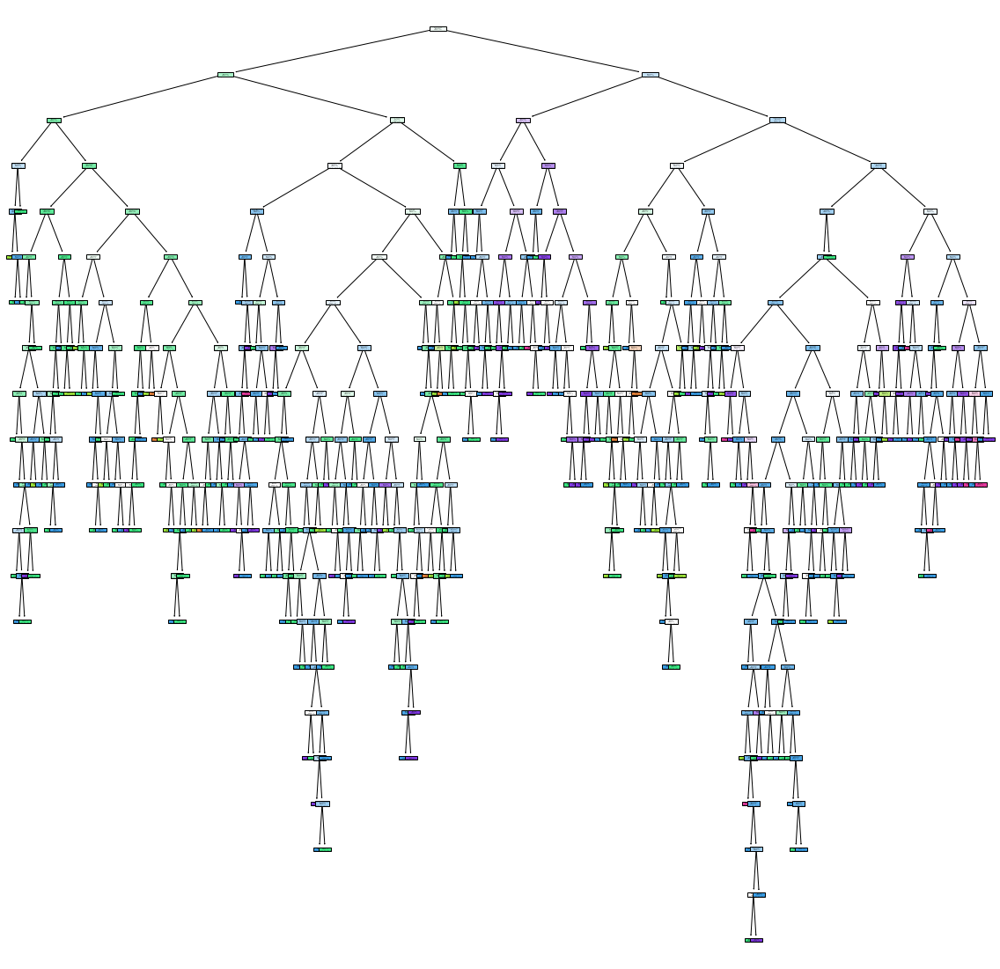

In [42]:
plt.figure(figsize=(20,20))
tree.plot_tree(dtc_model,filled=True,feature_names=X.columns)
plt.savefig("dt_model")

In [17]:
# df200=df.head(50)
# X=df200.drop("quality",axis=1)
# y=df200.quality
# X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=0)
# dtc_model.fit(X_train,y_train)
# plt.figure(figsize=(50,50))
# tree.plot_tree(dtc_model,filled=True,feature_names=ture_names=X.columns,)

In [18]:
plt.savefig("dt_model")

<Figure size 432x288 with 0 Axes>

In [19]:
dtc_model.predict(X_test)

array([7, 6, 7, 5, 5, 6, 5, 6, 5, 5, 5, 5, 6, 6, 6, 7, 7, 5, 5, 6, 6, 5,
       6, 6, 5, 6, 5, 7, 5, 5, 6, 6, 6, 6, 7, 7, 5, 6, 6, 7, 5, 7, 5, 7,
       5, 5, 5, 6, 7, 6, 5, 4, 6, 6, 6, 5, 5, 5, 6, 5, 5, 6, 6, 7, 5, 6,
       5, 5, 7, 6, 6, 6, 4, 5, 6, 6, 5, 5, 5, 8, 6, 6, 6, 7, 6, 5, 4, 5,
       5, 5, 5, 6, 4, 5, 7, 6, 6, 5, 6, 5, 6, 6, 6, 6, 5, 5, 5, 6, 6, 5,
       6, 5, 8, 6, 6, 6, 5, 7, 4, 6, 5, 6, 4, 5, 7, 6, 5, 5, 6, 6, 5, 6,
       6, 6, 6, 5, 6, 5, 7, 5, 6, 5, 5, 6, 5, 6, 8, 6, 5, 5, 5, 5, 6, 5,
       6, 6, 6, 7, 6, 7, 6, 5, 7, 5, 5, 5, 6, 6, 6, 6, 6, 5, 6, 7, 4, 6,
       5, 7, 7, 5, 6, 8, 6, 6, 6, 5, 6, 6, 5, 5, 6, 5, 6, 6, 5, 5, 5, 5,
       6, 5, 5, 7, 6, 6, 5, 6, 5, 7, 6, 6, 5, 6, 5, 6, 7, 6, 5, 7, 6, 5,
       5, 5, 7, 5, 6, 5, 7, 6, 6, 6, 5, 6, 5, 7, 6, 6, 6, 7, 7, 6, 5, 6,
       6, 5, 6, 5, 6, 5, 5, 6, 5, 5, 5, 6, 4, 6, 5, 5, 5, 7, 5, 6, 6, 6,
       6, 5, 5, 5, 5, 7, 5, 3, 5, 6, 5, 6, 7, 6, 6, 7, 5, 7, 3, 5, 6, 5,
       5, 5, 7, 6, 5, 5, 6, 6, 5, 6, 6, 6, 5, 5, 6,

In [21]:
dtc_model.score(X_train,y_train)

1.0

In [22]:
dtc_model.score(X_test,y_test)

0.65625

In [25]:
dtc_model.predict(X_test)

array([7, 6, 7, 5, 5, 6, 5, 6, 5, 5, 5, 5, 6, 6, 6, 7, 7, 5, 5, 6, 6, 5,
       6, 6, 5, 6, 5, 7, 5, 5, 6, 6, 6, 6, 7, 7, 5, 6, 6, 7, 5, 7, 5, 7,
       5, 5, 5, 6, 7, 6, 5, 4, 6, 6, 6, 5, 5, 5, 6, 5, 5, 6, 6, 7, 5, 6,
       5, 5, 7, 6, 6, 6, 4, 5, 6, 6, 5, 5, 5, 8, 6, 6, 6, 7, 6, 5, 4, 5,
       5, 5, 5, 6, 4, 5, 7, 6, 6, 5, 6, 5, 6, 6, 6, 6, 5, 5, 5, 6, 6, 5,
       6, 5, 8, 6, 6, 6, 5, 7, 4, 6, 5, 6, 4, 5, 7, 6, 5, 5, 6, 6, 5, 6,
       6, 6, 6, 5, 6, 5, 7, 5, 6, 5, 5, 6, 5, 6, 8, 6, 5, 5, 5, 5, 6, 5,
       6, 6, 6, 7, 6, 7, 6, 5, 7, 5, 5, 5, 6, 6, 6, 6, 6, 5, 6, 7, 4, 6,
       5, 7, 7, 5, 6, 8, 6, 6, 6, 5, 6, 6, 5, 5, 6, 5, 6, 6, 5, 5, 5, 5,
       6, 5, 5, 7, 6, 6, 5, 6, 5, 7, 6, 6, 5, 6, 5, 6, 7, 6, 5, 7, 6, 5,
       5, 5, 7, 5, 6, 5, 7, 6, 6, 6, 5, 6, 5, 7, 6, 6, 6, 7, 7, 6, 5, 6,
       6, 5, 6, 5, 6, 5, 5, 6, 5, 5, 5, 6, 4, 6, 5, 5, 5, 7, 5, 6, 6, 6,
       6, 5, 5, 5, 5, 7, 5, 3, 5, 6, 5, 6, 7, 6, 6, 7, 5, 7, 3, 5, 6, 5,
       5, 5, 7, 6, 5, 5, 6, 6, 5, 6, 6, 6, 5, 5, 6,

In [27]:
dtc_model.predict([X_test.iloc[0]])

array([7], dtype=int64)

Lets stabilized model because now my training score is coming 100 % but my test score 65 so this is looks like over fitted 

In [31]:
path = dtc_model.cost_complexity_pruning_path(X_train,y_train)
print(path)
ccp_alpha = path.ccp_alphas


{'ccp_alphas': array([0.        , 0.0005106 , 0.00052124, 0.00062549, 0.00065155,
       0.00068413, 0.00068413, 0.00068413, 0.00069499, 0.00071078,
       0.00071499, 0.00072172, 0.00072172, 0.00072601, 0.00073495,
       0.00073587, 0.00073842, 0.00074071, 0.00074277, 0.00074463,
       0.00074632, 0.00075394, 0.00075394, 0.00075886, 0.00076486,
       0.00078186, 0.00078186, 0.00078186, 0.00078186, 0.00078186,
       0.00078186, 0.00078186, 0.00078186, 0.00078186, 0.00078186,
       0.00078186, 0.00078186, 0.00078186, 0.00078186, 0.00078186,
       0.00093823, 0.00097733, 0.00097733, 0.00098365, 0.00104248,
       0.00104248, 0.00104248, 0.00104248, 0.00104248, 0.00104248,
       0.00104248, 0.00104248, 0.00104248, 0.00105551, 0.00111107,
       0.0011218 , 0.00117279, 0.00117279, 0.00117279, 0.00117279,
       0.00117279, 0.00117279, 0.00117279, 0.00117279, 0.00117279,
       0.00117279, 0.00117279, 0.00117279, 0.00117279, 0.00117279,
       0.00117279, 0.00118464, 0.00119141, 0.00

In [32]:
dt_modle2= [] 
for ccp in ccp_alpha :
    dt_m = DecisionTreeClassifier(ccp_alpha=ccp)
    dt_m.fit(X_train, y_train)
    dt_modle2.append(dt_m)

In [33]:
dt_modle2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.0005106029902187617),
 DecisionTreeClassifier(ccp_alpha=0.0005212405525149857),
 DecisionTreeClassifier(ccp_alpha=0.0006254886630179826),
 DecisionTreeClassifier(ccp_alpha=0.0006515506906437321),
 DecisionTreeClassifier(ccp_alpha=0.0006841282251759187),
 DecisionTreeClassifier(ccp_alpha=0.0006841282251759187),
 DecisionTreeClassifier(ccp_alpha=0.0006841282251759187),
 DecisionTreeClassifier(ccp_alpha=0.0006949874033533142),
 DecisionTreeClassifier(ccp_alpha=0.0007107825716113442),
 DecisionTreeClassifier(ccp_alpha=0.0007149911526274637),
 DecisionTreeClassifier(ccp_alpha=0.0007217176880976721),
 DecisionTreeClassifier(ccp_alpha=0.0007217176880976721),
 DecisionTreeClassifier(ccp_alpha=0.0007260136267173017),
 DecisionTreeClassifier(ccp_alpha=0.0007349491790461296),
 DecisionTreeClassifier(ccp_alpha=0.000735869015315274),
 DecisionTreeClassifier(ccp_alpha=0.0007384241160628965),
 DecisionTreeClassifier(ccp_alpha=0.0007407102

In [34]:
train_score = [i.score(X_train,y_train) for i in dt_modle2]
test_score = [i.score(X_test , y_test) for i in dt_modle2]

In [37]:
train_score,test_score

([1.0,
  0.9992181391712275,
  0.9984362783424551,
  0.9976544175136826,
  0.99687255668491,
  0.9937451133698202,
  0.9937451133698202,
  0.9960906958561376,
  0.9929632525410477,
  0.9937451133698202,
  0.9929632525410477,
  0.9921813917122753,
  0.9913995308835027,
  0.9906176700547302,
  0.9898358092259578,
  0.9874902267396404,
  0.9882720875684128,
  0.9851446442533229,
  0.9859265050820953,
  0.9859265050820953,
  0.9843627834245504,
  0.983580922595778,
  0.983580922595778,
  0.9827990617670055,
  0.982017200938233,
  0.9671618451915559,
  0.9663799843627834,
  0.9679437060203284,
  0.9679437060203284,
  0.9679437060203284,
  0.9687255668491008,
  0.9671618451915559,
  0.9671618451915559,
  0.9687255668491008,
  0.9679437060203284,
  0.9679437060203284,
  0.9671618451915559,
  0.9671618451915559,
  0.9671618451915559,
  0.9679437060203284,
  0.965598123534011,
  0.965598123534011,
  0.9632525410476935,
  0.9632525410476935,
  0.9554339327599687,
  0.9538702111024238,
  0.953870

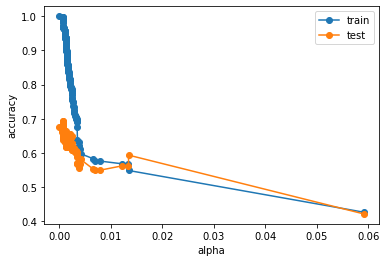

In [41]:
fix ,ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.plot(ccp_alpha,train_score,marker = 'o',label = 'train')
ax.plot(ccp_alpha,test_score,marker = 'o',label = 'test')
ax.legend()
plt.savefig("accuracy_1")

In [45]:
dt_model_ccp = DecisionTreeClassifier(ccp_alpha=.01)

In [47]:
dt_model_ccp.fit(X_train,y_train)

NameError: name 'x_train' is not defined

In [ ]:
t_model_ccp.score(x_train,y_train)